# Running MegaDetector on camera trap images

[Open this notebook in Colab](https://colab.research.google.com/github/agentmorris/MegaDetector/blob/main/notebooks/megadetector_colab.ipynb)

Adapted from previous versions by [@louis030195](https://github.com/louis030195)
and [@alsnothome](https://github.com/alsnothome).

Also see the [MegaDetector guide on GitHub](https://github.com/agentmorris/MegaDetector/blob/main/megadetector.md) and the [MegaDetector Python package documentation](https://megadetector.readthedocs.io).

This notebook is designed to load camera trap images that have already been uploaded to Google Drive. If you don't have your own images on Google Drive, this notebook will show you how to download some sample images from [LILA](https://lila.science).

MegaDetector output is saved in a .json file whose format is described  [here](https://github.com/agentmorris/MegaDetector/tree/main/megadetector/api/batch_processing#batch-processing-api-output-format). The last cell in this notebook will give you some pointers on how users typically work with MegaDetector output.

## Set up the Colab instance to run on a GPU accelerator


Navigate to Edit→Notebook Settings and select "GPU" from the "Hardware accelerator" drop-down menu.

## Install the MegaDetector Python package

This may take 2-3 minutes.  You may be asked to re-start the Colab runtime, that's OK.

In [1]:
import megadetector
import os

In [2]:
megadetector

<module 'megadetector' from 'C:\\Users\\iTonyJah\\AppData\\Local\\Programs\\Python\\Python313\\Lib\\site-packages\\megadetector\\__init__.py'>

## Mount Google Drive in Colab

You can skip this cell if you are running this notebook locally, and you don't need to access Google Drive.

You can mount your Google Drive if you have your sample images there, or if want to save the results to your Google Drive.  

Once you run the cell below, you will be prompted to authorize Colab to access your Google Drive.  Your Google Drive folders will then be mounted under `/content/drive` and can be viewed and navigated in the Files pane in Colab.

The method is described in [this Colab code snippet](https://colab.research.google.com/notebooks/io.ipynb#scrollTo=u22w3BFiOveA).

## Download sample images

We install Microsoft's [azcopy](https://docs.microsoft.com/en-us/azure/storage/common/storage-use-azcopy-v10) utility, which we then use to download a few camera trap images from the [Snapshot Serengeti](http://lila.science/datasets/snapshot-serengeti) dataset hosted on [lila.science](http://lila.science).  If you are using your own data, you can skip this step, and instead use the cell that follows to set "LOCAL_DIR" to the folder that contains your images.

## ...or use your own images.

If you didn't run the previous cell, use this cell to point this notebook to your images.  You'll need to change a few paths below as well.

In [2]:
# If someone runs this whole notebook, make sure we don't over-write the "LOCAL_DIR" variable
# set in the previous cell.
samples_path =  "/Snapshot_Safari_2024-samples/"

try:
    _ = LOCAL_INPUT_DIR
except:
    LOCAL_INPUT_DIR = samples_path

In [3]:
LOCAL_INPUT_DIR

'/Snapshot_Safari_2024-samples/'

In [4]:
_

'/Snapshot_Safari_2024-samples/'

## Run the detection script

This step executes the Python script `run_detector_batch.py` from the MegaDetector package. It has three mandatory arguments and one optional:

1. A MegaDetector model file (this can be a model name, like "MDV5A", or a path to a model file).
2. A folder containing images.  This notebook points to the folder where we just put our Snapshot Serengeti images; if your images were already on Google Drive, replace `[Image_Folder]` with your folder name.
3. The output JSON file location and name.

There are actually two variants of MegaDetector v5, called "v5a" and "v5b".  By default this notebook runs MDv5a; change "MDV5A" to "MDV5B" below to run MDv5b instead.

Both run at the same speed; if you are in a Colab session with a GPU accelerator, you should be able to process around four images per second.

Here we are running MegaDetector using python -m to invoke the module as if we were running it at the command line.  You can call this directly via Python code as well; documentation for this module is available [here](https://megadetector.readthedocs.io/en/latest/detection.html#module-megadetector.detection.run_detector_batch).


In [3]:
LOCAL_INPUT_DIR = os.path.join(os.getcwd(), 'Snapshot_Safari_2024-samples')

In [4]:
# Make sure the local input folder got set correctly
import os
assert os.path.isdir(LOCAL_INPUT_DIR)

# Choose a folder of images to process
images_dir = LOCAL_INPUT_DIR

# Choose a location for the output JSON file
output_file_path = '/snapshotserengeti-test/snapshot-serengeti-megadetector-results.json'

# Run MegaDetector
!python -m megadetector.detection.run_detector_batch "MDV5A" "$images_dir" "$output_file_path" --recursive --output_relative_filenames --quiet

C:\Users\iTonyJah\anaconda3\envs\megadetector_env\python.exe: Error while finding module specification for 'megadetector.detection.run_detector_batch' (ModuleNotFoundError: No module named 'megadetector')


In [13]:
megadetector.detection.run_detector_batch "MDV5A" "$images_dir" "$output_file_path" --recursive --output_relative_filenames --quiet

SyntaxError: invalid syntax (334328726.py, line 1)

In [9]:
output_file_path

'/snapshotserengeti-test/snapshot-serengeti-megadetector-results.json'

In [8]:
images_dir

'C:\\Users\\iTonyJah\\Projects\\megadetector\\Snapshot_Safari_2024-samples'

In [4]:
LOCAL_INPUT_DIR = os.path.join(os.getcwd(), 'Snapshot_Safari_2024-samples')
LOCAL_INPUT_DIR

'C:\\Users\\iTonyJah\\Projects\\megadetector\\Snapshot_Safari_2024-samples'

In [5]:
from megadetector.utils import url_utils
from megadetector.visualization import visualization_utils as vis_utils
from megadetector.detection import run_detector

# This is the image at the bottom of this page, it has one animal in it
image_url = 'https://github.com/agentmorris/MegaDetector/raw/main/images/orinoquia-thumb-web.jpg'
temporary_filename = url_utils.download_url(image_url)

image = vis_utils.load_image(temporary_filename)

# This will automatically download MDv5a; you can also specify a filename.
model = run_detector.load_detector('MDV5A')

result = model.generate_detections_one_image(image)

detections_above_threshold = [d for d in result['detections'] if d['conf'] > 0.2]
print('Found {} detections above threshold'.format(len(detections_above_threshold)))


Model v5a.0.1 available at C:\Users\iTonyJah\AppData\Local\Temp\megadetector_models\md_v5a.0.1.pt
PyTorch reports 0 available CUDA devices
GPU available: False
Loading PT detector with compatibility mode classic
Loaded image size 1280 from model metadata
Using model stride: 64
PTDetector using device cpu


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


Found 1 detections above threshold


In [10]:
from megadetector.detection.run_detector_batch import \
    load_and_run_detector_batch, write_results_to_file
from megadetector.utils import path_utils
import os

# Pick a folder to run MD on recursively, and an output file
image_folder =  os.path.join(os.getcwd(), 'megadetector_test_images')
output_file = os.path.expanduser('megadetector_output_test.json')

# Recursively find images
image_file_names = path_utils.find_images(image_folder,recursive=True)

# This will automatically download MDv5a; you can also specify a filename.
results = load_and_run_detector_batch('MDV5A', image_file_names)

# Write results to a format that Timelapse and other downstream tools like.
write_results_to_file(results,
                      output_file,
                      relative_path_base=image_folder,)
                      # detector_file=detector_filename,)

Model v5a.0.1 already exists and is valid at C:\Users\iTonyJah\AppData\Local\Temp\megadetector_models\md_v5a.0.1.pt
PyTorch reports 0 available CUDA devices
GPU available: False
PyTorch reports 0 available CUDA devices
GPU available: False
Bypassing imports for model type yolov5
Loading PT detector with compatibility mode classic
Loaded image size 1280 from model metadata
Using model stride: 64
PTDetector using device cpu


Fusing layers... 
Fusing layers... 
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs
Model summary: 733 layers, 140054656 parameters, 0 gradients, 208.8 GFLOPs


Loaded model in 0.83 seconds


  0%|                                                                                           | 0/17 [00:00<?, ?it/s]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/APN_S2_13U_R3_IMAG0010.jpeg


  6%|████▉                                                                              | 1/17 [00:02<00:43,  2.73s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/APN_S2_KUMH_R3_IMAG0178.jpeg


 12%|█████████▊                                                                         | 2/17 [00:05<00:40,  2.68s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/APN_S2_U63c_R4_IMAG0035.jpeg


 18%|██████████████▋                                                                    | 3/17 [00:07<00:36,  2.63s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/APN_S3_JJ7_R11_IMAG0342.jpeg


 24%|███████████████████▌                                                               | 4/17 [00:10<00:34,  2.64s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/APN_S3_TB17_R2_IMAG0562.jpeg


 29%|████████████████████████▍                                                          | 5/17 [00:13<00:31,  2.62s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/BLO_S2_C03_R2_IMAG0707.jpeg


 35%|█████████████████████████████▎                                                     | 6/17 [00:15<00:29,  2.66s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/BLO_S2_C03_R2_IMAG0709.jpeg


 41%|██████████████████████████████████▏                                                | 7/17 [00:18<00:26,  2.68s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/CDB_S1_A05_R1_IMAG0212.jpeg


 47%|███████████████████████████████████████                                            | 8/17 [00:21<00:23,  2.66s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/CDB_S1_A05_R1_IMAG0217.jpeg


 53%|███████████████████████████████████████████▉                                       | 9/17 [00:23<00:21,  2.64s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/EFA_S1_EFA07_R29_IMAG0236.jpeg


 59%|████████████████████████████████████████████████▏                                 | 10/17 [00:26<00:18,  2.58s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/KAR_S2_C01_R2_IMAG0210.jpeg


 65%|█████████████████████████████████████████████████████                             | 11/17 [00:28<00:15,  2.60s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/KAR_S2_F02_R2_IMAG1104.jpeg


 71%|█████████████████████████████████████████████████████████▉                        | 12/17 [00:31<00:12,  2.60s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/KAR_S3_KARWA03_R8_IMAG1425.jpeg


 76%|██████████████████████████████████████████████████████████████▋                   | 13/17 [00:33<00:09,  2.40s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/KAR_S3_KARWA03_R8_IMAG1427.jpeg


 82%|███████████████████████████████████████████████████████████████████▌              | 14/17 [00:35<00:06,  2.26s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/MAD_S1_MAD03_R4_IMAG4724.jpeg


 88%|████████████████████████████████████████████████████████████████████████▎         | 15/17 [00:37<00:04,  2.17s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/MAD_S1_MAD03_R4_IMAG4725.jpeg


 94%|█████████████████████████████████████████████████████████████████████████████▏    | 16/17 [00:39<00:02,  2.10s/it]

Processing image C:/Users/iTonyJah/Projects/megadetector/megadetector_test_images/MAD_S1_MAD03_R4_IMAG4726.jpeg


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:41<00:00,  2.43s/it]

Output file saved at megadetector_output_test.json


{'images': [{'file': 'APN_S2_13U_R3_IMAG0010.jpeg', 'detections': []},
  {'file': 'APN_S2_KUMH_R3_IMAG0178.jpeg',
   'detections': [{'category': '1',
     'conf': 0.971,
     'bbox': [0.4614, 0.2384, 0.4826, 0.7289]},
    {'category': '1', 'conf': 0.595, 'bbox': [0.0, 0.3969, 0.0524, 0.2919]},
    {'category': '1', 'conf': 0.523, 'bbox': [0.0, 0.3715, 0.1161, 0.3145]},
    {'category': '1', 'conf': 0.368, 'bbox': [0.5374, 0.3414, 0.0424, 0.092]},
    {'category': '1', 'conf': 0.082, 'bbox': [0.5273, 0.2789, 0.0532, 0.1494]},
    {'category': '1',
     'conf': 0.008,
     'bbox': [0.1998, 0.3525, 0.0196, 0.0225]}]},
  {'file': 'APN_S2_U63c_R4_IMAG0035.jpeg',
   'detections': [{'category': '1',
     'conf': 0.963,
     'bbox': [0.6917, 0.4335, 0.3082, 0.5174]},
    {'category': '1', 'conf': 0.96, 'bbox': [0.3425, 0.3159, 0.1662, 0.2125]},
    {'category': '1', 'conf': 0.956, 'bbox': [0.0609, 0.2325, 0.1111, 0.1949]},
    {'category': '1',
     'conf': 0.667,
     'bbox': [0.9722, 0.3395,

## Visualize batch processing script outputs

Here we use the `visualize_detector_output.py` in the `visualization` folder of the MegaDetector repo to see the output of the MegaDetector visualized on our images. It will save images annotated with the results (original images will *not* be modified) to the folder you specify here.

In [14]:
# Render bounding boxes on our images
visualization_dir = '/content/visualized_images'
!python -m megadetector.visualization.visualize_detector_output "$output_file_path" "$visualization_dir" --confidence 0.2 --images_dir "$images_dir"

C:\Users\iTonyJah\anaconda3\envs\megadetector_env\python.exe: Error while finding module specification for 'megadetector.visualization.visualize_detector_output' (ModuleNotFoundError: No module named 'megadetector')


In [15]:
help(megadetector.visualize_detector_output)

AttributeError: module 'megadetector' has no attribute 'visualize_detector_output'

anno_KAR_S3_KARWA03_R8_IMAG1425.jpeg


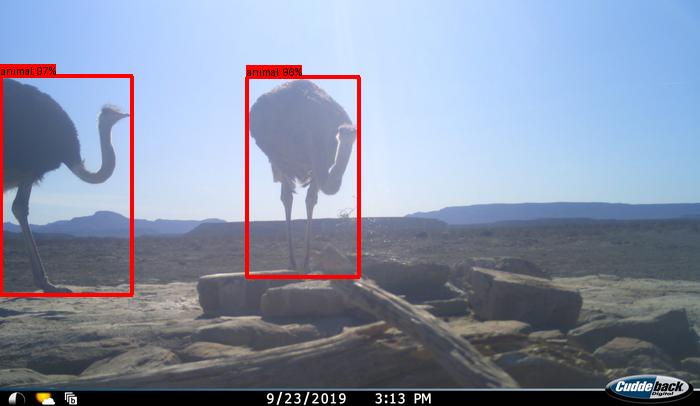

anno_MAD_S1_MAD03_R4_IMAG4724.jpeg


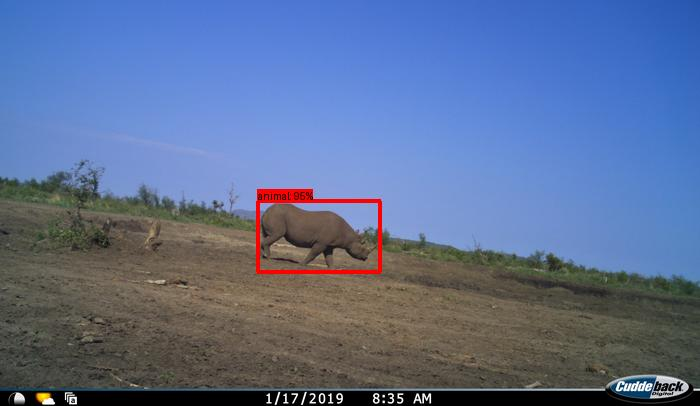

anno_EFA_S1_EFA07_R29_IMAG0236.jpeg


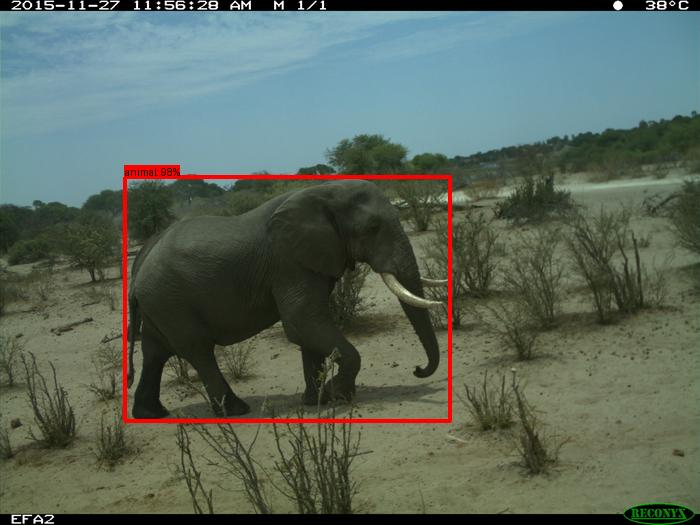

anno_APN_S2_KUMH_R3_IMAG0178.jpeg


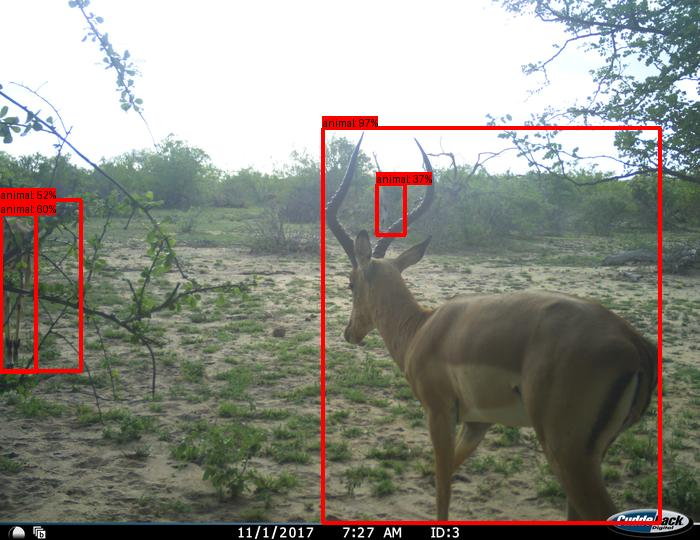

anno_APN_S3_TB17_R2_IMAG0562.jpeg


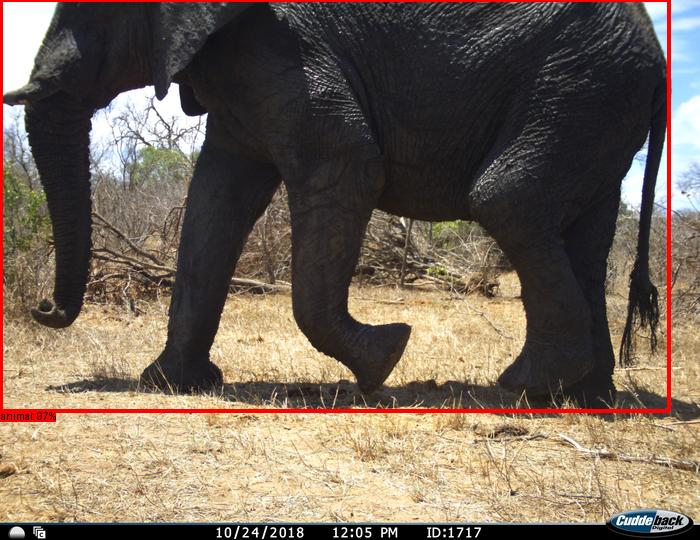

anno_APN_S2_13U_R3_IMAG0010.jpeg


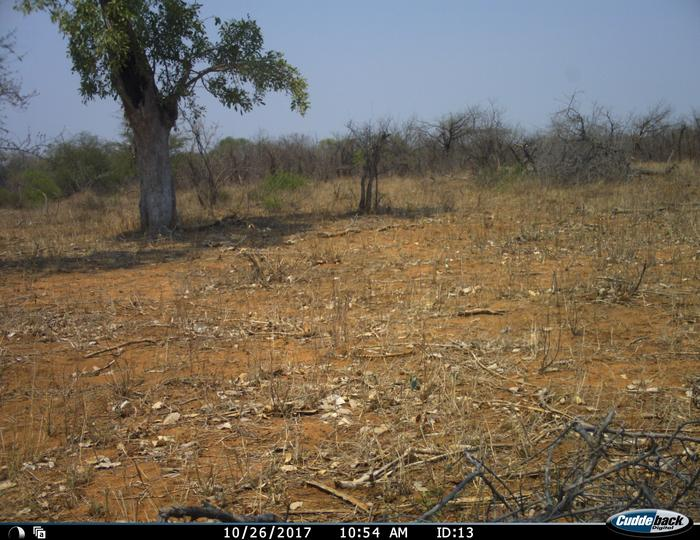

anno_MAD_S1_MAD03_R4_IMAG4726.jpeg


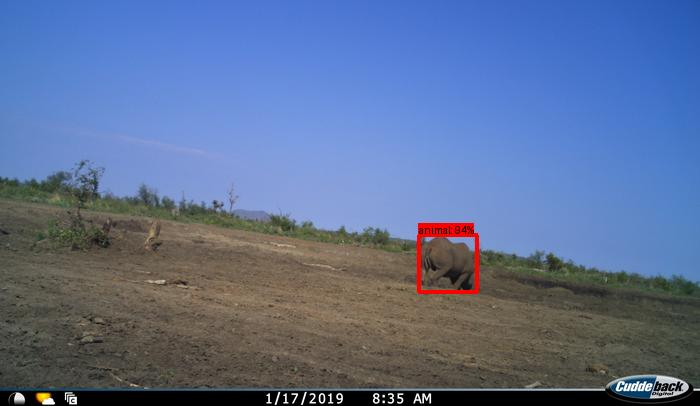

anno_KAR_S2_F02_R2_IMAG1104.jpeg


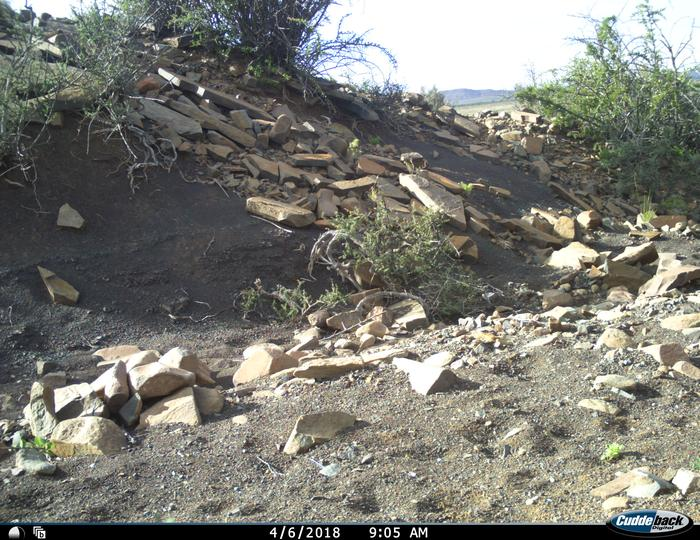

anno_MAD_S1_MAD03_R4_IMAG4725.jpeg


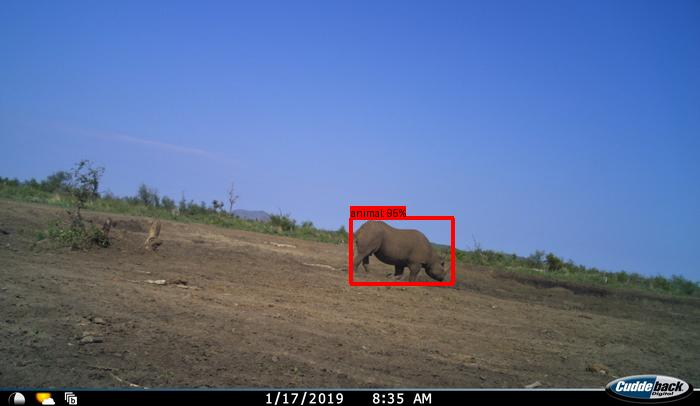

anno_BLO_S2_C03_R2_IMAG0707.jpeg


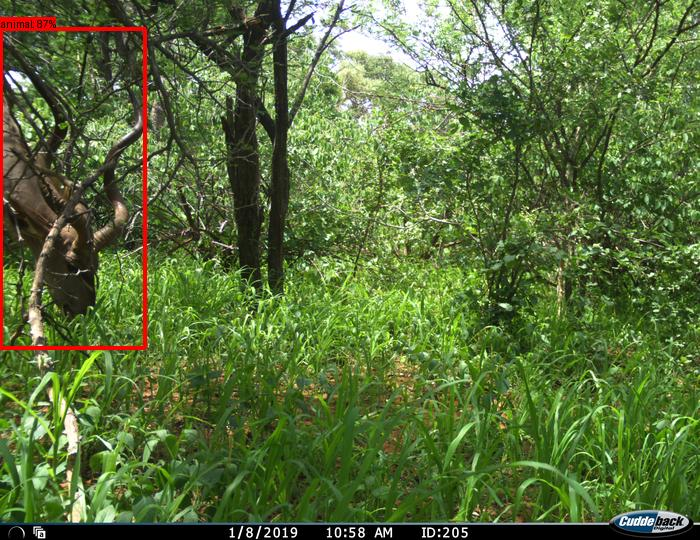

anno_KAR_S3_KARWA03_R8_IMAG1427.jpeg


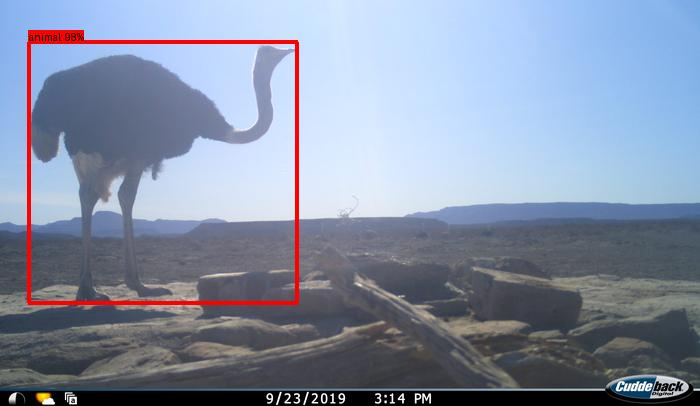

anno_APN_S2_U63c_R4_IMAG0035.jpeg


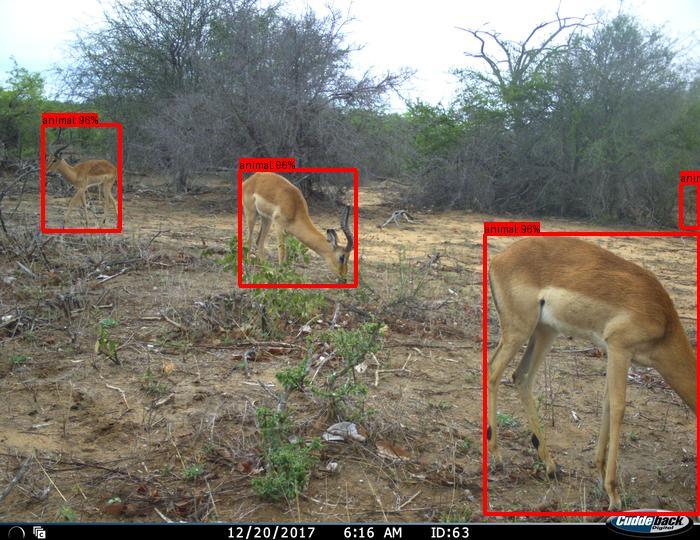

anno_APN_S3_JJ7_R11_IMAG0342.jpeg


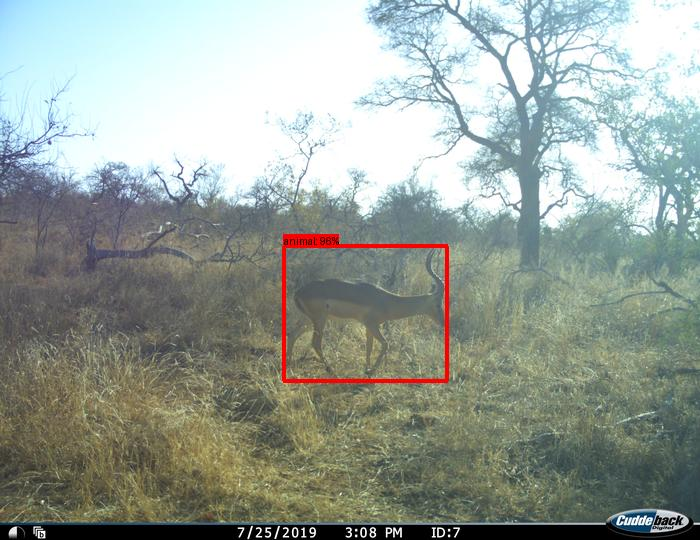

anno_BLO_S2_C03_R2_IMAG0709.jpeg


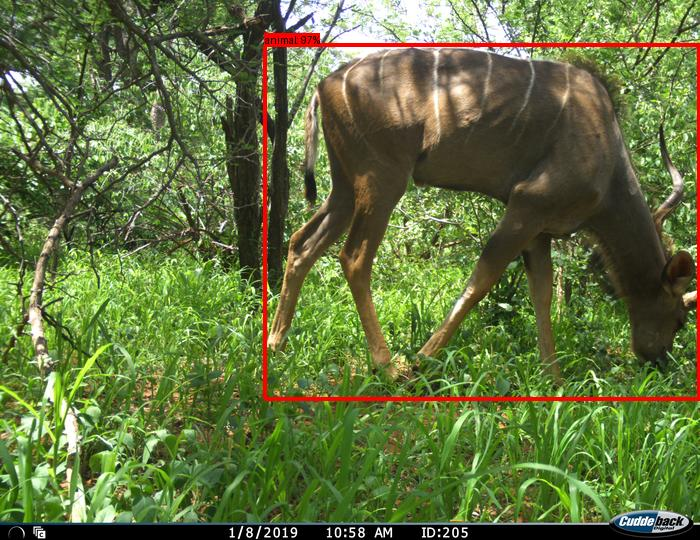

anno_KAR_S2_C01_R2_IMAG0210.jpeg


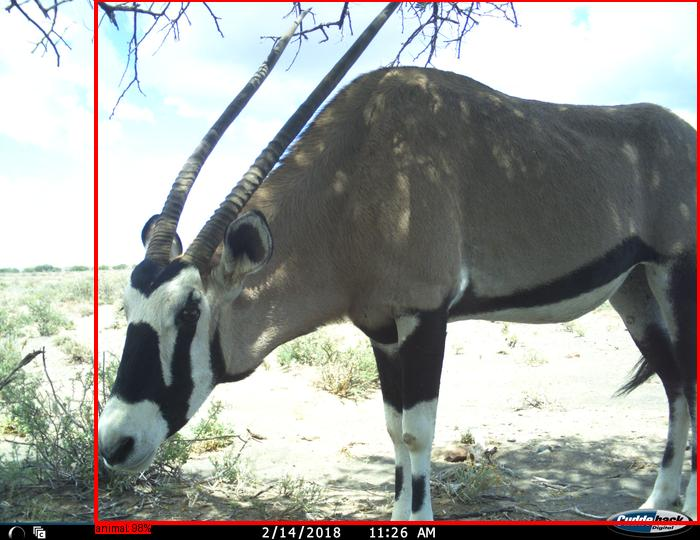

anno_CDB_S1_A05_R1_IMAG0212.jpeg


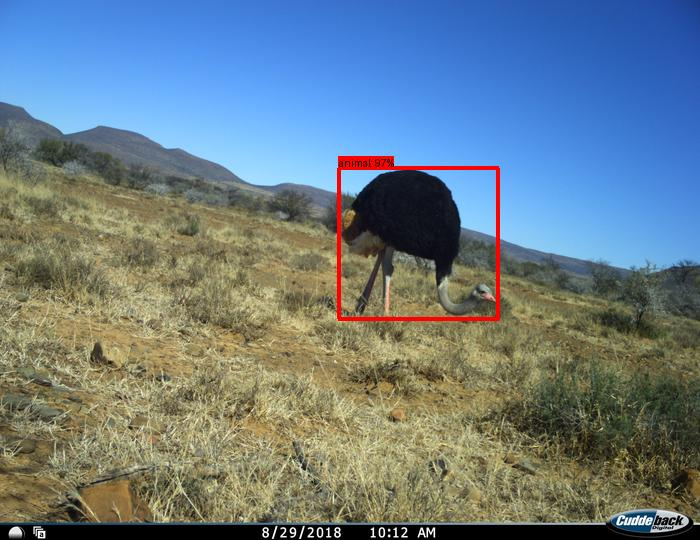

anno_CDB_S1_A05_R1_IMAG0217.jpeg


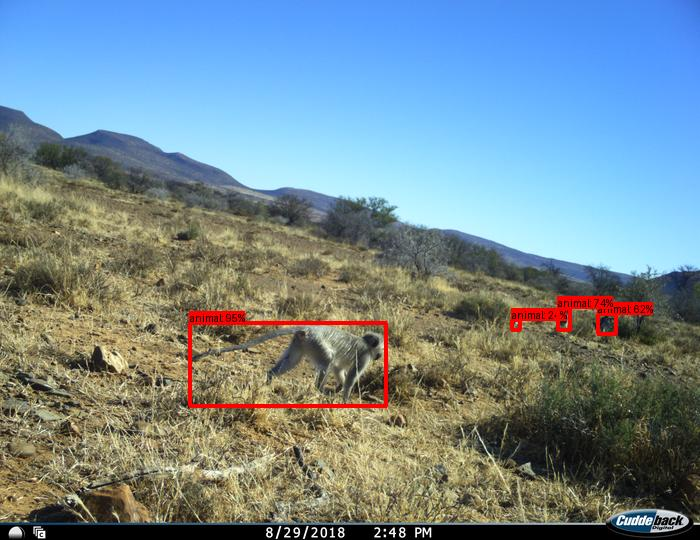

In [ ]:
# Show the images with bounding boxes in Colab
import os
from PIL import Image

for viz_file_name in os.listdir(visualization_dir):
  print(viz_file_name)
  im = Image.open(os.path.join(visualization_dir, viz_file_name))
  display(im)

# Next steps

Now that you have run MegaDetector on a few images, here are some pointers to help you take advantage of MegaDetector to label your survey images more quickly.

### Ways to use the output .json in a camera trap image processing workflow

#### 1. Timelapse

[Timelapse](http://saul.cpsc.ucalgary.ca/timelapse/pmwiki.php?n=Main.HomePage) is an open-source tool for annotating camera trap images. We have worked with the Timelapse developer to integrate MegaDetector results into Timelapse, so a user can:

- Select or sort images based on whether they contain animal or people or vehicles.
- View bounding boxes during additional manual annotation steps

See the [Timelapse Image Recognition Guide](https://saul.cpsc.ucalgary.ca/timelapse/uploads/Guides/TimelapseImageRecognitionGuide.pdf) for more information.

![Screenshot showing the Timelapse application with MegaDetector output, shown as a bounding box around the detected animal](https://github.com/agentmorris/MegaDetector/blob/main/megadetector/api/batch_processing/integration/images/tl_boxes.jpg?raw=1)


#### 2. Separating images into folders that contain animals/people/vehicles/nothing

Some MegaDetector users do image review without Timelapse, by moving the images to separate folders containing animals/people/vehicles/nothing according to MegaDetector output. You can use the script [separate_detections_into_folders.py](https://github.com/agentmorris/MegaDetector/blob/main/megadetector/postprocessing/separate_detections_into_folders.py) for this.

